# **Deep Learning Course**

# **Introduction to Transfer Learning and Pretrained Models like ResNet50, VGG16 and MobileNetv2**

---

### **Student Information:**

- **Name:** Muhammad Erfan Bagherinejad
- **Student Number:** 402200359

---

In this project, we aim to design and evaluate a basic Convolutional Neural Network (CNN) for image classification using the CIFAR-10 dataset. This dataset consists of 60,000 images across 10 different categories, with 50,000 images for training and 10,000 for testing. Our objective is to explore the impact of various network architectures and techniques on model performance.

## Assignment Outline

In this Assignment, we will utilize Transfer Learning with the MobileNetV2 architecture, leveraging the pre-trained weights from ImageNet. The main tasks include:

1. **Data Preparation**: We will use the Oxford 102 Flower dataset to train our model. The dataset will be divided into training and validation sets.
   
2. **Model Implementation**: We will implement MobileNetV2 using PyTorch and customize the final layers to suit our classification task.

3. **Training**: The model will be trained using Cross Entropy loss, and we will monitor performance over epochs.

4. **Freezing Layers**: We will experiment with freezing certain layers of MobileNetV2 to optimize training efficiency.

5. **Evaluation**: Finally, we will evaluate the model's performance and compare it with other architectures, such as ResNet50 and VGG16.

This project aims to demonstrate the effectiveness of Transfer Learning in image classification tasks.

--- 


In [ ]:
import numpy as np
from collections import defaultdict
import os
import shutil
import torch
from torchvision import transforms, datasets
from torch.utils.data import DataLoader, Dataset, random_split
import requests
from zipfile import ZipFile
from PIL import Image
from sklearn.model_selection import train_test_split
import tarfile
import random
from scipy.io import loadmat
import os
import shutil
import requests
from io import BytesIO
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from scipy.io import loadmat
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, random_split
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision import models



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


# **Section 1 and Section 2**: MobileNetv2

### MobileNetV2 Architecture Overview

MobileNetV2 is a lightweight convolutional neural network designed for mobile and edge devices. It improves upon its predecessor, MobileNetV1, by introducing a novel layer called the inverted residual block, which enhances performance while keeping computational costs low.

#### Key Features:
- **Inverted Residuals**: These blocks use depthwise separable convolutions to reduce the number of parameters and computations, making the model efficient.
- **Linear Bottlenecks**: The architecture ends with linear layers, which help in minimizing the loss of information during the down-sampling process.

#### Input Dimensions:
- **Input Size**: MobileNetV2 typically accepts input images of size **224 x 224 pixels** with 3 color channels (RGB).

#### Preprocessing Steps:
1. **Resize**: Images should be resized to 224x224 pixels.
2. **Normalization**: Pixel values should be scaled to the range [0, 1] and then normalized using the following mean and standard deviation:
   - Mean: [0.485, 0.456, 0.406]
   - Standard Deviation: [0.229, 0.224, 0.225]

#### Output Dimensions:
- The output of MobileNetV2 for classification tasks is a tensor containing the predicted probabilities for each class, usually of shape **(batch_size, num_classes)**, where `num_classes` is the number of categories in the classification task, typically 1000 for ImageNet.

This architecture is particularly suited for applications requiring real-time inference on devices with limited computational resources.

In [2]:
# Load the pre-trained MobileNetV2 model
model = models.mobilenet_v2(pretrained=True)
model = model.to(device)
model.eval()

# Load ImageNet class names
imagenet_classes = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()


# Print model architecture, input, and output details
print("MobileNetV2 Architecture:\n", model)
print("\nInput size expected by the model: [Batch Size, 3, 224, 224]")
print("Output size of the model:", model.classifier[-1].out_features)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 135MB/s]


MobileNetV2 Architecture:
 MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
        

## Download Some images for Testing MobileNetv2

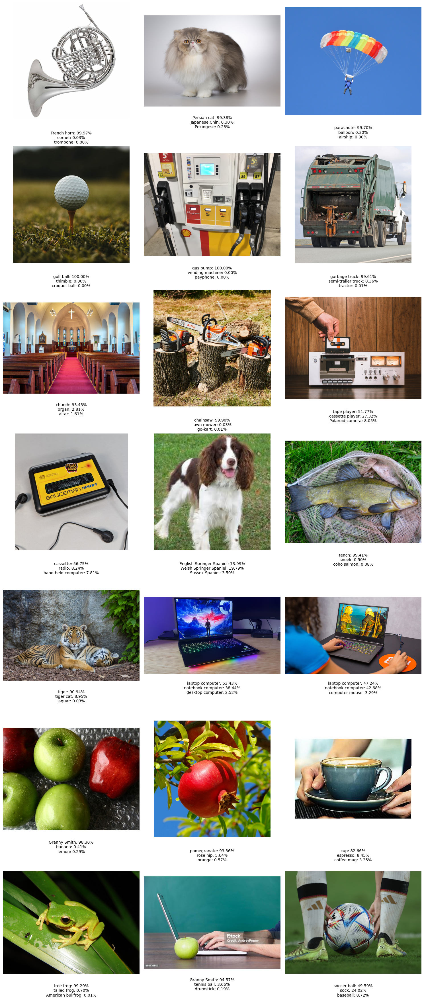

In [ ]:

preprocess = transforms.Compose([
    transforms.Resize((224, 224)), 
    transforms.ToTensor(),        
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize using ImageNet mean and std
                         std=[0.229, 0.224, 0.225])
])

image_urls = ["https://cdn11.bigcommerce.com/s-k2zti3v21f/images/stencil/original/products/17142/29173/8d-conn-professional-french-horn-hero_copy__49891.1680118478.jpg?c=1",
             "https://hips.hearstapps.com/hmg-prod/images/most-expensive-cat-breeds-persian-670fff71b2b10.jpg",
             "https://wisconsinskydivingcenter.com/wp-content/uploads/2019/05/32953512668_855bee5bf6_h.jpg",
             "https://justgolfstuff.ca/cdn/shop/articles/soft-vs-hard-golf-balls_600x600_crop_center.jpg?v=1686926327",
             "https://i.redd.it/ax3bckpzzuf01.jpg",
             "https://globalhealthnow.org/sites/default/files/styles/max_650x650/public/images/2016-09/garbage%20trucks.jpg",
             "https://t4.ftcdn.net/jpg/02/97/78/03/360_F_297780357_pK8VCA7wctbTFusAGiCfcoxbJLRwC9Bs.jpg",
             "https://hips.hearstapps.com/hmg-prod/images/electric-chainsaw-testing-outdoor-2023-0860-preview-6500b9b8be829.jpg?crop=0.669xw:1.00xh;0.195xw,0&resize=1200:*",
             "https://media.wired.com/photos/638a69295eae104862d77bf4/4:3/w_2131,h_1598,c_limit/Gear-Cassettes-667969950.jpg",
             "https://www.bandcds.co.uk/wp-content/uploads/2023/01/Rimas-Music-cassette-player-photo-7.jpg",
             "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRAzwkinKm1v8vVgCfx-C3Z_Yv9wLhVFRwWZg&s",
             "https://warehouse1.indicia.org.uk/upload/13/89/12/p18dn6s0ap1ljh1h9c1co3sfm1iqv2.jpg",
             "https://www.zoo-berlin.de/fileadmin/_processed_/c/3/csm_Sumatra-Tiger_-_Lotte_und_Luise_TierparkBerlin_6474f676ae.jpg",
             "https://cdn.mos.cms.futurecdn.net/3kcgKLkfPRbskpsYzW239d.jpg",
             "https://image.coolblue.de/content/066d98574cb6246982d680624eac107f",
             "https://media.post.rvohealth.io/wp-content/uploads/sites/3/2022/07/what_to_know_apples_green_red_732x549_thumb.jpg",
             "https://www.thesill.com/cdn/shop/files/Wonderful_Pomegranate_Tree_Fruit.jpg?v=1709820509&width=1946",
             "https://img.fruugo.com/product/2/45/1256722452_0340_0340.jpg",
             "https://media.australian.museum/media/dd/images/Green_Leaf_Tree_Frog.width-1200.febd90e.jpg",
             "https://media.istockphoto.com/id/480536603/photo/person-using-laptop-besides-green-apple.jpg?s=612x612&w=is&k=20&c=gAeJ53M3DjvwpnsCgtUp46UiHsb4KkSfaJ4WT2n3w3s=",
             "https://static.scientificamerican.com/sciam/cache/file/A8C04F01-9779-477A-B104C8D52998E12C_source.jpg?crop=4%3A3%2Csmart&w=1200"]

images = []
predictions = []

for image_url in image_urls:
    response = requests.get(image_url)
    img = Image.open(BytesIO(response.content))
    images.append(img) 
    input_tensor = preprocess(img).unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        output = model(input_tensor)

    # Get top-3 predicted classes
    probabilities = torch.nn.functional.softmax(output[0], dim=0)
    top3_prob, top3_catid = torch.topk(probabilities, 3)
    
    pred = [(imagenet_classes[top3_catid[i]], top3_prob[i].item()) for i in range(3)]
    predictions.append(pred)

fig, axes = plt.subplots(7, 3, figsize=(15, 35)) 
axes = axes.flatten() 

for ax, img, pred in zip(axes, images, predictions):
    ax.imshow(img)
    ax.axis('off')
    pred_text = "\n".join([f"{label}: {prob:.2%}" for label, prob in pred])
    ax.text(0.5, -0.1, pred_text, ha='center', va='top', transform=ax.transAxes)

plt.tight_layout()
plt.show()

# **Section 3** 102 Oxford Flowers Dataset

## Downloading dataset

In [ ]:
base_url = "https://www.robots.ox.ac.uk/~vgg/data/flowers/102/"
image_url = base_url + "102flowers.tgz"
label_url = base_url + "imagelabels.mat"

data_dir = "./data/oxford102"
os.makedirs(data_dir, exist_ok=True)

# Download images
if not os.path.exists(os.path.join(data_dir, "102flowers.tgz")):
    print("Downloading 102flowers dataset...")
    with requests.get(image_url, stream=True) as r:
        with open(os.path.join(data_dir, "102flowers.tgz"), "wb") as f:
            shutil.copyfileobj(r.raw, f)

# Download labels
if not os.path.exists(os.path.join(data_dir, "imagelabels.mat")):
    print("Downloading labels...")
    with requests.get(label_url, stream=True) as r:
        with open(os.path.join(data_dir, "imagelabels.mat"), "wb") as f:
            shutil.copyfileobj(r.raw, f)

# Extract images
if not os.path.exists(os.path.join(data_dir, "jpg")):
    print("Extracting 102flowers images...")
    with tarfile.open(os.path.join(data_dir, "102flowers.tgz"), 'r:gz') as tar:
        tar.extractall(data_dir)

labels_path = os.path.join(data_dir, "imagelabels.mat")
labels_data = loadmat(labels_path)
labels = labels_data["labels"][0]  # Extract labels
image_dir = os.path.join(data_dir, "jpg")
images = sorted(os.listdir(image_dir))
print('Extract Done')

Extracting 102flowers images...
Extract Done


## Creating Dataset

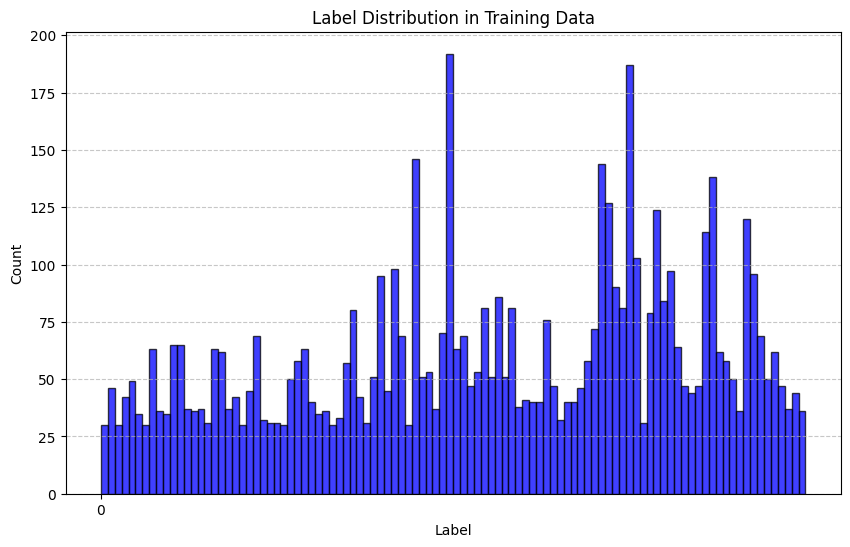

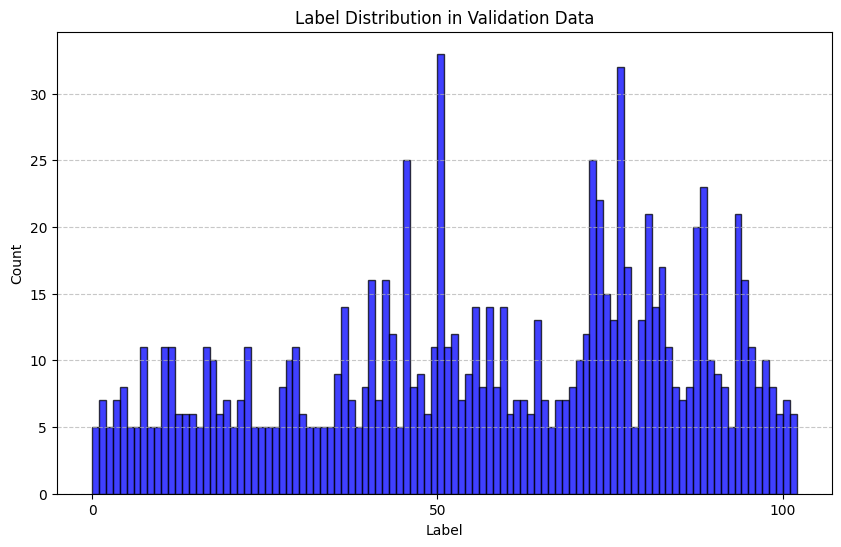

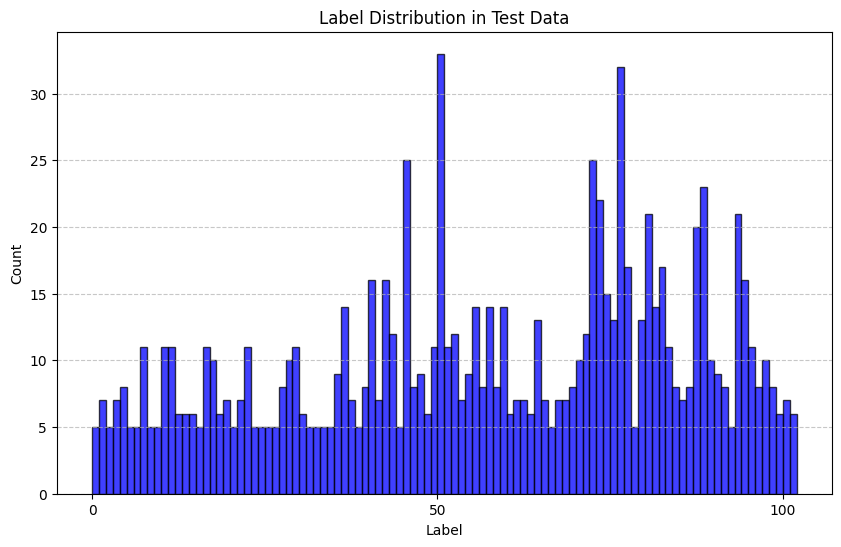

Training dataset size: 6151
Validation dataset size: 1019
Test dataset size: 1019


In [ ]:
dataset = [(os.path.join(image_dir, img), label - 1) for img, label in zip(images, labels)]  # 0-indexed labels
def split_dataset(labels, test_ratio=0.15, val_ratio=0.15):
    label_indices = defaultdict(list)
    for idx, label in enumerate(labels):
        label_indices[label].append(idx)

    train_indices, test_indices, val_indices = [], [], []
    
    for label, indices in label_indices.items():
        np.random.shuffle(indices)
        test_size = int(len(indices) * test_ratio)
        val_size = int(len(indices) * val_ratio)
        test_indices.extend(indices[:test_size])
        val_indices.extend(indices[test_size:test_size + val_size])
        train_indices.extend(indices[test_size + val_size:])

    np.random.shuffle(train_indices)
    np.random.shuffle(test_indices)
    np.random.shuffle(val_indices)
    
    return {
        "train": train_indices,
        "test": test_indices,
        "validation": val_indices
    }

# Split the dataset
splits = split_dataset(labels, test_ratio=0.13, val_ratio=0.13)
train_data = [dataset[i] for i in splits['train']]
val_data = [dataset[i] for i in splits['validation']]
test_data = [dataset[i] for i in splits['test']]

def plot_label_distribution(data, title):
    labels = [label for _, label in data]
    plt.figure(figsize=(10, 6))
    plt.hist(labels, bins=range(min(labels), max(labels) + 2), alpha=0.75, color="blue", edgecolor="black")
    plt.title(title)
    plt.xlabel("Label")
    plt.ylabel("Count")
    plt.xticks(range(min(labels), max(labels) + 1, max(1, len(labels)//20)))
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.show()

plot_label_distribution(train_data, "Label Distribution in Training Data")
plot_label_distribution(val_data, "Label Distribution in Validation Data")
plot_label_distribution(test_data, "Label Distribution in Test Data")

class Oxford102Dataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        image_path, label = self.data[idx]
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

# Define preprocessing for training data
preprocess_1 = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  
    transforms.RandomHorizontalFlip(),                      
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  
    transforms.ToTensor(),                                 
    transforms.Normalize(mean=[0.5, 0.5, 0.5],          
                         std=[0.5, 0.5, 0.5])
])
# Define preprocessing for test and validation data
preprocess_2 = transforms.Compose([
    transforms.Resize((224, 224)),  
    transforms.ToTensor(),         
    transforms.Normalize(mean=[0.5, 0.5, 0.5],            
                         std=[0.5, 0.5, 0.5])
])

# Create datasets
train_dataset = Oxford102Dataset(train_data, transform=preprocess_1)
val_dataset = Oxford102Dataset(val_data, transform=preprocess_2)
test_dataset = Oxford102Dataset(test_data, transform=preprocess_2)

Create data loaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Print dataset sizes
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")


## Visualizing Dataset 102 Oxford Flowers

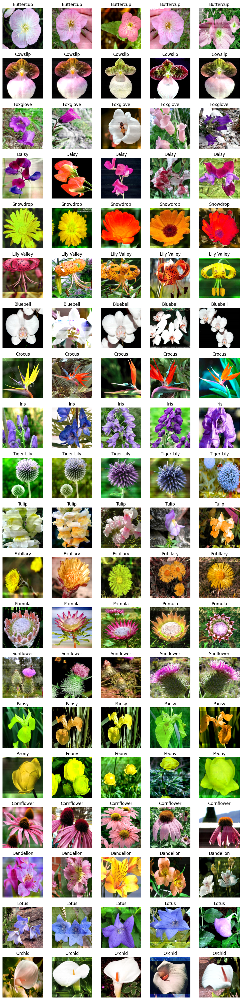

In [ ]:
# Define class labels for Oxford 102 Flowers
flower_labels = [
    "Buttercup",
    "Cowslip",
    "Foxglove",
    "Daisy",
    "Snowdrop",
    "Lily Valley",
    "Bluebell",
    "Crocus",
    "Iris",
    "Tiger Lily",
    "Tulip",
    "Fritillary",
    "Primula",
    "Sunflower",
    "Pansy",
    "Peony",
    "Cornflower",
    "Dandelion",
    "Lotus",
    "Orchid",
    "Anemone",
    "Alstroemeria",
    "Aster",
    "Borage",
    "Butterfly Bush",
    "Calendula",
    "Canna Lily",
    "Chrysanthemum",
    "Clover",
    "Columbine",
    "Cosmos",
    "Dahlia",
    "Delphinium",
    "Echinacea",
    "Hollyhock",
    "Hyacinth",
    "Jasmine",
    "Knapweed",
    "Lantana",
    "Lavender",
    "Lilac",
    "Lily",
    "Magnolia",
    "Marigold",
    "Nasturtium",
    "Noble Larkspur",
    "Poppy",
    "Red Hot Poker",
    "Rhododendron",
    "Rose",
    "Snapdragon",
    "Statice",
    "Sweet Pea",
    "Tiger Lily",
    "Verbena",
    "Wisteria",
    "Zinnia",
    "Cactus Flower",
    "Creeping Jenny",
    "Flowering Quince",
    "Hibiscus",
    "Lily of the Valley",
    "Mallow",
    "Mountain Avens",
    "Peacock Orchid",
    "Pincushion Flower",
    "Pineapple Lily",
    "Ragged Robin",
    "Rocket",
    "Sage",
    "Sea Holly",
    "Siberian Iris",
    "Skunk Cabbage",
    "Soapwort",
    "St. John's Wort",
    "Sweet William",
    "Thistle",
    "Tropaeolum",
    "Tulbaghia",
    "Violets",
    "Wildflower",
    "Wolffia",
    "Wood Sorrel",
    "Yellow Archangel",
    "Zantedeschia",
    "Golden Samphire",
    "Sea Lavender",
    "Alpine Aster",
    "Common Bluebell",
    "Cowslip",
    "Giant Bellflower",
    "Musk Rose",
    "Periwinkle",
    "Pineapple Sage",
    "Redcurrant",
    "Scented Geranium",
    "Silene",
    "Silver Birch",
    "Tansy",
    "Thrift",
    "Yarrow",
    "Zinnia"
]

def min_max_normalize(image_array):
    image_array = np.asarray(image_array)
    min_val = image_array.min(axis=(1, 2), keepdims=True)  # Min per channel
    max_val = image_array.max(axis=(1, 2), keepdims=True)  # Max per channel
    range_val = max_val - min_val
    range_val[range_val == 0] = 1
    normalized_array = (image_array - min_val) / range_val
    return normalized_array

def show_random_images_per_class(dataset, flower_labels, num_classes=10, images_per_class=2):
    fig, axs = plt.subplots(num_classes, images_per_class, figsize=(images_per_class * 2, num_classes * 2))
    axs = axs.flatten()

    samples_per_class = {i: 0 for i in range(num_classes)}
    while any(samples_per_class[i] < images_per_class for i in range(num_classes)):
        index = random.randint(0, len(dataset) - 1)
        img, label = dataset[index]

        if label < num_classes and samples_per_class[label] < images_per_class:
            ax = axs[label * images_per_class + samples_per_class[label]]
            img = min_max_normalize(img.permute(1, 2, 0).numpy())
            ax.imshow(img)  # Unnormalize for display
            ax.set_title(flower_labels[label])
            ax.axis('off')
            samples_per_class[label] += 1

    plt.tight_layout()
    plt.show()

show_random_images_per_class(train_dataset, flower_labels, num_classes=20, images_per_class=5)

In [ ]:
# Function to evaluate the model
def evaluate_model(model, data_loader, criterion, device):
    model = model.to(device)
    model.eval()
    running_loss, correct, total = 0.0, 0, 0

    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Evaluating"):
            images, labels = images.to(device), labels.to(device).long()
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    return running_loss / len(data_loader), 100 * correct / total

# Function to train the model
def train_model(model, train_loader, val_loader, test_loader, criterion, optimizer, device, best_model_path, num_epochs=30):
    model = model.to(device)
    best_val_loss = float('inf')
    early_stop_epoch = 1
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        # Training phase
        for images, labels in tqdm(train_loader, desc=f"Training Epoch {epoch + 1}/{num_epochs}"):
            images, labels = images.to(device), labels.to(device).long()

            # Forward pass and loss computation
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Backpropagation and optimizer step
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Validation phase
        val_loss, val_accuracy = evaluate_model(model, val_loader, criterion, device)
        train_loss, train_accuracy = evaluate_model(model, train_loader, criterion, device)

        # Store metrics for analysis
        train_losses.append(train_loss)
        val_losses.append(val_loss)
        train_accuracies.append(train_accuracy)
        val_accuracies.append(val_accuracy)

        print(f"Epoch [{epoch + 1}/{num_epochs}] - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}% - "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.2f}%")
        print(50*"=")
        
        # Save best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            early_stop_epoch = epoch + 1
            torch.save(model.state_dict(), best_model_path)

    plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, early_stop_epoch, num_epochs)
    load_best_model(model, best_model_path)

    print(f"Training completed. Best model saved at epoch {early_stop_epoch}.")
    evaluate_and_log(model, train_loader, val_loader, test_loader, criterion, device)

# Function to plot training metrics
def plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, best_epoch, num_epochs):
    epochs = range(1, num_epochs + 1)

    plt.figure(figsize=(12, 5))

    # Loss Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.plot(epochs, val_losses, label='Validation Loss')
    plt.scatter(best_epoch, val_losses[best_epoch - 1], color='red', label='Best Model')
    plt.title("Loss over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.axvline(best_epoch, color='grey', linestyle='--', label='Best Epoch')
    plt.legend()

    # Accuracy Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Train Accuracy')
    plt.plot(epochs, val_accuracies, label='Validation Accuracy')
    plt.scatter(best_epoch, val_accuracies[best_epoch - 1], color='red', label='Best Model')
    plt.title("Accuracy over Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy (%)")
    plt.axvline(best_epoch, color='grey', linestyle='--', label='Best Epoch')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Function to load the best model
def load_best_model(model, path):
    model.load_state_dict(torch.load(path, weights_only=True, map_location=torch.device('cpu')), strict=False)
    print(f"Best model loaded from {path}.")

# Evaluate and log final metrics
def evaluate_and_log(model, train_loader, val_loader, test_loader, criterion, device):
    print("=" * 50)
    train_loss, train_accuracy = evaluate_model(model, train_loader, criterion, device)
    print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%")

    val_loss, val_accuracy = evaluate_model(model, val_loader, criterion, device)
    print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")

    test_loss, test_accuracy = evaluate_model(model, test_loader, criterion, device)
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%")

In [5]:
# Calculate total parameters and learnable parameters
def parameter_calculator(model, model_label):
    total_params = sum(p.numel() for p in model.parameters())
    learnable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    print(f'{model_label}: Total Parameters: {total_params}, Learnable Parameters: {learnable_params}, {learnable_params/total_params*100:.4f}% is learnable')

In [ ]:
Load MobileNetV2 and modify
MBNV2_pretrained = models.mobilenet_v2(pretrained=True)
MBNV2_pretrained.classifier[1] = nn.Linear(MBNV2_pretrained.last_channel, len(flower_labels))  # Replace the classification layer
MBNV2_pretrained = MBNV2_pretrained.to(device) 

# Freeze feature extraction layers
for param in MBNV2_pretrained.features.parameters():
    param.requires_grad = False
    
parameter_calculator(MBNV2_pretrained, "MobileNet v2 pretrained")
print(MBNV2_pretrained)

MobileNet v2 pretrained: Total Parameters: 2354534, Learnable Parameters: 130662, 5.5494% is learnable
MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
         

Evaluating: 100%|██████████| 385/385 [01:09<00:00,  5.53it/s]


Epoch [1/30] - Train Loss: 1.1617, Train Acc: 82.00% - Val Loss: 1.1873, Val Acc: 81.84%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.67it/s]


Epoch [2/30] - Train Loss: 0.6138, Train Acc: 89.71% - Val Loss: 0.6798, Val Acc: 87.34%


Evaluating: 100%|██████████| 385/385 [01:09<00:00,  5.55it/s]


Epoch [3/30] - Train Loss: 0.4114, Train Acc: 93.06% - Val Loss: 0.4939, Val Acc: 89.70%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.47it/s]


Epoch [4/30] - Train Loss: 0.3100, Train Acc: 94.70% - Val Loss: 0.4236, Val Acc: 91.66%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.47it/s]


Epoch [5/30] - Train Loss: 0.2692, Train Acc: 95.06% - Val Loss: 0.3982, Val Acc: 91.27%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.46it/s]


Epoch [6/30] - Train Loss: 0.2133, Train Acc: 96.07% - Val Loss: 0.3574, Val Acc: 91.27%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.43it/s]


Epoch [7/30] - Train Loss: 0.1961, Train Acc: 96.02% - Val Loss: 0.3340, Val Acc: 91.95%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.46it/s]


Epoch [8/30] - Train Loss: 0.1653, Train Acc: 96.78% - Val Loss: 0.3138, Val Acc: 92.25%


Evaluating: 100%|██████████| 385/385 [01:09<00:00,  5.51it/s]


Epoch [9/30] - Train Loss: 0.1464, Train Acc: 97.06% - Val Loss: 0.3151, Val Acc: 91.95%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.49it/s]


Epoch [10/30] - Train Loss: 0.1396, Train Acc: 97.04% - Val Loss: 0.3024, Val Acc: 92.54%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.47it/s]


Epoch [11/30] - Train Loss: 0.1170, Train Acc: 97.45% - Val Loss: 0.3028, Val Acc: 92.35%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.42it/s]


Epoch [12/30] - Train Loss: 0.1098, Train Acc: 97.55% - Val Loss: 0.2874, Val Acc: 91.85%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.49it/s]


Epoch [13/30] - Train Loss: 0.1111, Train Acc: 97.55% - Val Loss: 0.2890, Val Acc: 92.84%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.46it/s]


Epoch [14/30] - Train Loss: 0.0952, Train Acc: 97.90% - Val Loss: 0.2988, Val Acc: 92.35%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.49it/s]


Epoch [15/30] - Train Loss: 0.0865, Train Acc: 98.21% - Val Loss: 0.2877, Val Acc: 92.05%


Evaluating: 100%|██████████| 385/385 [01:11<00:00,  5.42it/s]


Epoch [16/30] - Train Loss: 0.0826, Train Acc: 98.21% - Val Loss: 0.2651, Val Acc: 93.03%


Evaluating: 100%|██████████| 385/385 [01:11<00:00,  5.37it/s]


Epoch [17/30] - Train Loss: 0.0761, Train Acc: 98.41% - Val Loss: 0.2700, Val Acc: 92.93%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.60it/s]


Epoch [18/30] - Train Loss: 0.0734, Train Acc: 98.46% - Val Loss: 0.2821, Val Acc: 92.54%


Evaluating: 100%|██████████| 385/385 [01:09<00:00,  5.57it/s]


Epoch [19/30] - Train Loss: 0.0622, Train Acc: 98.88% - Val Loss: 0.2639, Val Acc: 93.42%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.65it/s]


Epoch [20/30] - Train Loss: 0.0649, Train Acc: 98.67% - Val Loss: 0.2698, Val Acc: 93.33%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.61it/s]


Epoch [21/30] - Train Loss: 0.0609, Train Acc: 98.54% - Val Loss: 0.2849, Val Acc: 92.05%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.62it/s]


Epoch [22/30] - Train Loss: 0.0637, Train Acc: 98.62% - Val Loss: 0.2827, Val Acc: 91.85%


Evaluating: 100%|██████████| 385/385 [01:09<00:00,  5.52it/s]


Epoch [23/30] - Train Loss: 0.0595, Train Acc: 98.72% - Val Loss: 0.2680, Val Acc: 92.93%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.50it/s]


Epoch [24/30] - Train Loss: 0.0497, Train Acc: 99.04% - Val Loss: 0.2813, Val Acc: 93.23%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.46it/s]


Epoch [25/30] - Train Loss: 0.0528, Train Acc: 98.72% - Val Loss: 0.2643, Val Acc: 93.52%


Evaluating: 100%|██████████| 385/385 [01:10<00:00,  5.47it/s]


Epoch [26/30] - Train Loss: 0.0515, Train Acc: 98.73% - Val Loss: 0.2853, Val Acc: 92.35%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.67it/s]


Epoch [27/30] - Train Loss: 0.0441, Train Acc: 98.94% - Val Loss: 0.2576, Val Acc: 92.64%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.64it/s]


Epoch [28/30] - Train Loss: 0.0458, Train Acc: 98.93% - Val Loss: 0.2805, Val Acc: 92.74%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.70it/s]


Epoch [29/30] - Train Loss: 0.0479, Train Acc: 98.81% - Val Loss: 0.2907, Val Acc: 92.93%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.66it/s]


Epoch [30/30] - Train Loss: 0.0453, Train Acc: 98.89% - Val Loss: 0.2798, Val Acc: 92.64%


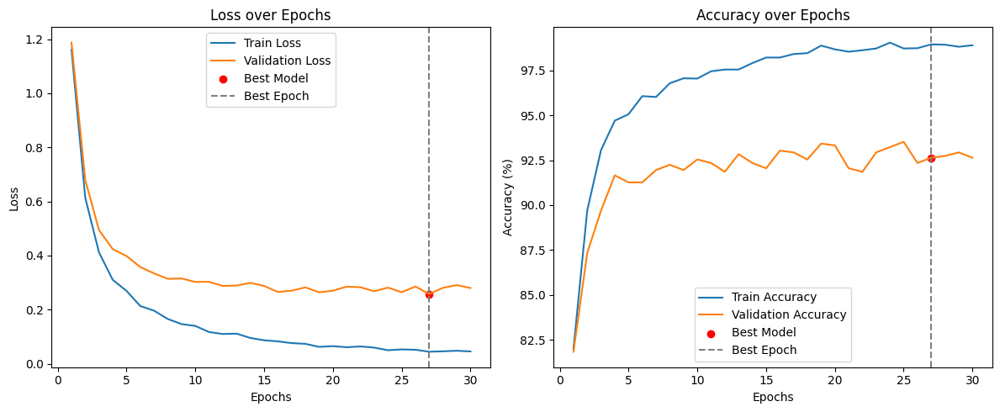

Best model loaded from MBNV2_pretrained.pth.
Training completed. Best model saved at epoch 27.


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.71it/s]


Train Loss: 0.0495, Train Accuracy: 98.65%


Evaluating: 100%|██████████| 64/64 [00:05<00:00, 11.93it/s]


Validation Loss: 0.2576, Validation Accuracy: 92.64%


Evaluating: 100%|██████████| 64/64 [00:05<00:00, 11.60it/s]

Test Loss: 0.2189, Test Accuracy: 93.52%


In [10]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(MBNV2_pretrained.classifier.parameters(), lr=0.0005)
train_model(MBNV2_pretrained, train_loader, val_loader, test_loader, criterion, optimizer, device, "MBNV2_pretrained.pth", num_epochs=30)

# **Section 4** VGG16

### VGG16 Architecture Overview

VGG16 is a convolutional neural network architecture developed by the Visual Geometry Group (VGG) at the University of Oxford. It is known for its simplicity and effectiveness in image classification tasks.

#### Key Features:
- **Depth**: VGG16 consists of 16 layers with learnable weights, including 13 convolutional layers and 3 fully connected layers.
- **Convolutional Layers**: It uses small \(3 \times 3\) convolutional filters, which help in capturing fine details while maintaining a manageable number of parameters.
- **Max Pooling**: After certain convolutional layers, max pooling is applied with a \(2 \times 2\) filter and a stride of 2 to reduce the spatial dimensions.

#### Input Dimensions:
- **Input Size**: VGG16 takes input images of size **224 x 224 pixels** with 3 color channels (RGB).

#### Preprocessing Steps:
1. **Resize**: Images should be resized to 224x224 pixels.
2. **Normalization**: Pixel values should be scaled to the range [0, 1] and normalized using the following mean and standard deviation:
   - Mean: [0.485, 0.456, 0.406]
   - Standard Deviation: [0.229, 0.224, 0.225]

#### Output Dimensions:
- The output layer of VGG16 is a fully connected layer that produces a tensor of shape **(batch_size, num_classes)**, where `num_classes` is the number of categories in the classification task (typically 1000 for ImageNet).

VGG16 is widely used for its strong performance in various image classification benchmarks. Its architecture, characterized by deep layers and small convolutional filters, enables it to learn complex features effectively, making it a popular choice for transfer learning tasks.

In [ ]:
#Load VGG16 and modify
VGG16 = models.vgg16(pretrained=True)
VGG16.classifier[6] = nn.Linear(VGG16.classifier[6].in_features, len(flower_labels))  # Replace the classification layer
VGG16 = VGG16.to(device)  # Move model to GPU or CPU

# Freeze all layers exept last fc layer
for param in VGG16.parameters():
    param.requires_grad = False
for param in VGG16.classifier[6].parameters():
    param.requires_grad = True

parameter_calculator(VGG16, "VGG16")
print(VGG16)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 203MB/s] 


VGG16: Total Parameters: 134678438, Learnable Parameters: 417894, 0.3103% is learnable
VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15)

Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.76it/s]


Epoch [1/30] - Train Loss: 0.7365, Train Acc: 80.49% - Val Loss: 0.8748, Val Acc: 76.55%


Evaluating: 100%|██████████| 385/385 [01:19<00:00,  4.84it/s]


Epoch [2/30] - Train Loss: 0.5918, Train Acc: 83.51% - Val Loss: 0.7921, Val Acc: 78.02%


Evaluating: 100%|██████████| 385/385 [01:19<00:00,  4.83it/s]


Epoch [3/30] - Train Loss: 0.4343, Train Acc: 88.21% - Val Loss: 0.6798, Val Acc: 82.14%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.74it/s]


Epoch [4/30] - Train Loss: 0.3861, Train Acc: 88.99% - Val Loss: 0.6429, Val Acc: 81.06%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.77it/s]


Epoch [5/30] - Train Loss: 0.3448, Train Acc: 90.05% - Val Loss: 0.6258, Val Acc: 83.51%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.73it/s]


Epoch [6/30] - Train Loss: 0.2978, Train Acc: 90.78% - Val Loss: 0.6251, Val Acc: 82.43%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.74it/s]


Epoch [7/30] - Train Loss: 0.2578, Train Acc: 92.41% - Val Loss: 0.6244, Val Acc: 82.63%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.72it/s]


Epoch [8/30] - Train Loss: 0.2580, Train Acc: 92.36% - Val Loss: 0.6276, Val Acc: 82.53%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.74it/s]


Epoch [9/30] - Train Loss: 0.2546, Train Acc: 92.00% - Val Loss: 0.6225, Val Acc: 82.63%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.76it/s]


Epoch [10/30] - Train Loss: 0.2082, Train Acc: 93.32% - Val Loss: 0.5661, Val Acc: 85.38%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.75it/s]


Epoch [11/30] - Train Loss: 0.2278, Train Acc: 93.03% - Val Loss: 0.6068, Val Acc: 83.71%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.74it/s]


Epoch [12/30] - Train Loss: 0.1934, Train Acc: 94.08% - Val Loss: 0.6094, Val Acc: 84.20%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.74it/s]


Epoch [13/30] - Train Loss: 0.1975, Train Acc: 93.77% - Val Loss: 0.6084, Val Acc: 83.32%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.78it/s]


Epoch [14/30] - Train Loss: 0.1764, Train Acc: 94.50% - Val Loss: 0.5613, Val Acc: 85.28%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.77it/s]


Epoch [15/30] - Train Loss: 0.1809, Train Acc: 94.57% - Val Loss: 0.6178, Val Acc: 85.38%


Evaluating: 100%|██████████| 385/385 [01:19<00:00,  4.82it/s]


Epoch [16/30] - Train Loss: 0.1667, Train Acc: 94.50% - Val Loss: 0.5761, Val Acc: 85.08%


Evaluating: 100%|██████████| 385/385 [01:22<00:00,  4.69it/s]


Epoch [17/30] - Train Loss: 0.1473, Train Acc: 95.38% - Val Loss: 0.6244, Val Acc: 82.92%


Evaluating: 100%|██████████| 385/385 [01:21<00:00,  4.70it/s]


Epoch [18/30] - Train Loss: 0.1569, Train Acc: 94.94% - Val Loss: 0.6184, Val Acc: 82.73%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.77it/s]


Epoch [19/30] - Train Loss: 0.1891, Train Acc: 93.85% - Val Loss: 0.6080, Val Acc: 83.91%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.79it/s]


Epoch [20/30] - Train Loss: 0.1345, Train Acc: 96.03% - Val Loss: 0.5696, Val Acc: 85.87%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.78it/s]


Epoch [21/30] - Train Loss: 0.1372, Train Acc: 95.68% - Val Loss: 0.6080, Val Acc: 84.40%


Evaluating: 100%|██████████| 385/385 [01:19<00:00,  4.82it/s]


Epoch [22/30] - Train Loss: 0.1178, Train Acc: 96.26% - Val Loss: 0.5816, Val Acc: 86.65%


Evaluating: 100%|██████████| 385/385 [01:19<00:00,  4.84it/s]


Epoch [23/30] - Train Loss: 0.1328, Train Acc: 95.48% - Val Loss: 0.5797, Val Acc: 85.18%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.81it/s]


Epoch [24/30] - Train Loss: 0.1317, Train Acc: 96.02% - Val Loss: 0.6072, Val Acc: 85.87%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.78it/s]


Epoch [25/30] - Train Loss: 0.1237, Train Acc: 96.05% - Val Loss: 0.6194, Val Acc: 84.99%


Evaluating: 100%|██████████| 385/385 [01:19<00:00,  4.82it/s]


Epoch [26/30] - Train Loss: 0.1138, Train Acc: 96.62% - Val Loss: 0.6026, Val Acc: 86.06%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.81it/s]


Epoch [27/30] - Train Loss: 0.0991, Train Acc: 96.93% - Val Loss: 0.6044, Val Acc: 85.57%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.80it/s]


Epoch [28/30] - Train Loss: 0.1110, Train Acc: 96.62% - Val Loss: 0.5970, Val Acc: 85.97%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.80it/s]


Epoch [29/30] - Train Loss: 0.0964, Train Acc: 96.94% - Val Loss: 0.5622, Val Acc: 86.16%


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.77it/s]


Epoch [30/30] - Train Loss: 0.1077, Train Acc: 96.60% - Val Loss: 0.5604, Val Acc: 86.75%


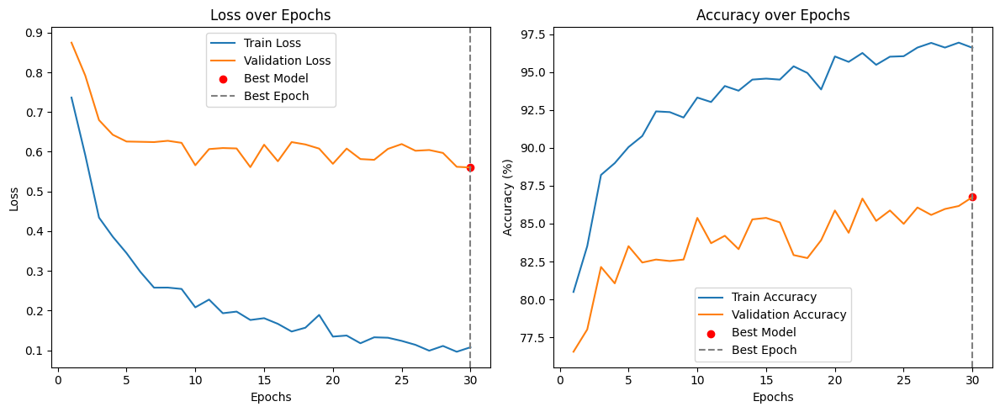

Best model loaded from VGG16.pth.
Training completed. Best model saved at epoch 30.


Evaluating: 100%|██████████| 385/385 [01:20<00:00,  4.79it/s]


Train Loss: 0.0948, Train Accuracy: 97.27%


Evaluating: 100%|██████████| 64/64 [00:07<00:00,  8.65it/s]


Validation Loss: 0.5604, Validation Accuracy: 86.75%


Evaluating: 100%|██████████| 64/64 [00:07<00:00,  8.21it/s]

Test Loss: 0.6097, Test Accuracy: 86.46%


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(VGG16.classifier.parameters(), lr=0.001)
train_model(VGG16, train_loader, val_loader, test_loader, criterion, optimizer, device, "VGG16.pth", num_epochs=30)

# ResNet50

### ResNet50 Architecture Overview

ResNet50 is a convolutional neural network architecture that belongs to the Residual Network (ResNet) family, developed by Microsoft Research. It is designed to overcome the vanishing gradient problem in deep networks by introducing residual connections, allowing for much deeper models.

#### Key Features:
- **Depth**: ResNet50 consists of 50 layers, including convolutional layers, pooling layers, and fully connected layers.
- **Residual Connections**: Instead of learning the desired output directly, residual connections allow layers to learn the residual mapping, which makes it easier to optimize deep networks.
- **Bottleneck Architecture**: ResNet50 uses a bottleneck structure, which includes three layers in each residual block (1x1, 3x3, and 1x1 convolutions). This reduces the number of parameters and computational complexity.

#### Input Dimensions:
- **Input Size**: ResNet50 accepts input images of size **224 x 224 pixels** with 3 color channels (RGB).

#### Preprocessing Steps:
1. **Resize**: Images should be resized to 224x224 pixels.
2. **Normalization**: Pixel values should be scaled to the range [0, 1] and normalized using the following mean and standard deviation:
   - Mean: [0.485, 0.456, 0.406]
   - Standard Deviation: [0.229, 0.224, 0.225]

#### Output Dimensions:
- The output layer of ResNet50 is a fully connected layer that produces a tensor of shape **(batch_size, num_classes)**, where `num_classes` is the number of categories in the classification task (typically 1000 for ImageNet).

ResNet50 has gained popularity due to its ability to train very deep networks effectively while maintaining high performance. Its innovative use of residual connections allows for better gradient flow, making it a powerful choice for various computer vision tasks, including image classification and object detection.

In [ ]:
#Load ResNet50 and modify
ResNet50 = models.resnet50(pretrained=True)
ResNet50.fc = nn.Linear(ResNet50.fc.in_features, len(flower_labels))  # Replace the classification layer
ResNet50 = ResNet50.to(device)

# Freeze feature extraction layers
for param in ResNet50.parameters():
    param.requires_grad = False
    
for param in ResNet50.fc.parameters():
    param.requires_grad = True

parameter_calculator(ResNet50, "ResNet50")
print(ResNet50)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 191MB/s]


ResNet50: Total Parameters: 23717030, Learnable Parameters: 208998, 0.8812% is learnable
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
   

Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.19it/s]


Epoch [1/30] - Train Loss: 1.2015, Train Acc: 79.50% - Val Loss: 1.2127, Val Acc: 80.77%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.17it/s]


Epoch [2/30] - Train Loss: 0.6623, Train Acc: 88.07% - Val Loss: 0.7159, Val Acc: 87.05%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.07it/s]


Epoch [3/30] - Train Loss: 0.4424, Train Acc: 91.79% - Val Loss: 0.5199, Val Acc: 89.21%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.16it/s]


Epoch [4/30] - Train Loss: 0.3306, Train Acc: 93.76% - Val Loss: 0.4289, Val Acc: 90.19%


Evaluating: 100%|██████████| 385/385 [01:16<00:00,  5.03it/s]


Epoch [5/30] - Train Loss: 0.2880, Train Acc: 93.77% - Val Loss: 0.4017, Val Acc: 90.78%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.10it/s]


Epoch [6/30] - Train Loss: 0.2461, Train Acc: 94.91% - Val Loss: 0.3894, Val Acc: 89.89%


Evaluating: 100%|██████████| 385/385 [01:16<00:00,  5.04it/s]


Epoch [7/30] - Train Loss: 0.2208, Train Acc: 95.09% - Val Loss: 0.3479, Val Acc: 91.95%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.15it/s]


Epoch [8/30] - Train Loss: 0.1910, Train Acc: 95.81% - Val Loss: 0.3234, Val Acc: 91.46%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.17it/s]


Epoch [9/30] - Train Loss: 0.1702, Train Acc: 96.36% - Val Loss: 0.3131, Val Acc: 92.54%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.11it/s]


Epoch [10/30] - Train Loss: 0.1535, Train Acc: 96.36% - Val Loss: 0.3077, Val Acc: 92.15%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.15it/s]


Epoch [11/30] - Train Loss: 0.1426, Train Acc: 96.96% - Val Loss: 0.2963, Val Acc: 92.74%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.18it/s]


Epoch [12/30] - Train Loss: 0.1322, Train Acc: 96.76% - Val Loss: 0.2849, Val Acc: 92.05%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.09it/s]


Epoch [13/30] - Train Loss: 0.1361, Train Acc: 96.75% - Val Loss: 0.2889, Val Acc: 92.15%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.19it/s]


Epoch [14/30] - Train Loss: 0.1016, Train Acc: 97.81% - Val Loss: 0.2630, Val Acc: 92.93%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.13it/s]


Epoch [15/30] - Train Loss: 0.1223, Train Acc: 96.93% - Val Loss: 0.2905, Val Acc: 92.93%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.16it/s]


Epoch [16/30] - Train Loss: 0.0974, Train Acc: 97.64% - Val Loss: 0.2808, Val Acc: 93.13%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.20it/s]


Epoch [17/30] - Train Loss: 0.1136, Train Acc: 96.99% - Val Loss: 0.2807, Val Acc: 92.05%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.17it/s]


Epoch [18/30] - Train Loss: 0.0918, Train Acc: 97.74% - Val Loss: 0.2774, Val Acc: 92.54%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.12it/s]


Epoch [19/30] - Train Loss: 0.0781, Train Acc: 97.97% - Val Loss: 0.2536, Val Acc: 93.42%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.17it/s]


Epoch [20/30] - Train Loss: 0.0805, Train Acc: 97.94% - Val Loss: 0.2844, Val Acc: 92.15%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.19it/s]


Epoch [21/30] - Train Loss: 0.0803, Train Acc: 97.94% - Val Loss: 0.2744, Val Acc: 92.84%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.08it/s]


Epoch [22/30] - Train Loss: 0.0855, Train Acc: 97.72% - Val Loss: 0.2967, Val Acc: 92.15%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.19it/s]


Epoch [23/30] - Train Loss: 0.0724, Train Acc: 98.21% - Val Loss: 0.2700, Val Acc: 93.13%


Evaluating: 100%|██████████| 385/385 [01:13<00:00,  5.21it/s]


Epoch [24/30] - Train Loss: 0.0668, Train Acc: 98.23% - Val Loss: 0.2645, Val Acc: 92.54%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.09it/s]


Epoch [25/30] - Train Loss: 0.0701, Train Acc: 97.95% - Val Loss: 0.2952, Val Acc: 91.85%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.15it/s]


Epoch [26/30] - Train Loss: 0.0664, Train Acc: 98.46% - Val Loss: 0.2776, Val Acc: 92.05%


Evaluating: 100%|██████████| 385/385 [01:15<00:00,  5.12it/s]


Epoch [27/30] - Train Loss: 0.0603, Train Acc: 98.28% - Val Loss: 0.2820, Val Acc: 93.42%


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.16it/s]


Epoch [28/30] - Train Loss: 0.0594, Train Acc: 98.33% - Val Loss: 0.2680, Val Acc: 92.35%


Evaluating: 100%|██████████| 385/385 [01:13<00:00,  5.23it/s]


Epoch [29/30] - Train Loss: 0.0581, Train Acc: 98.52% - Val Loss: 0.2542, Val Acc: 92.74%


Evaluating: 100%|██████████| 385/385 [01:13<00:00,  5.21it/s]


Epoch [30/30] - Train Loss: 0.0541, Train Acc: 98.67% - Val Loss: 0.2704, Val Acc: 93.03%


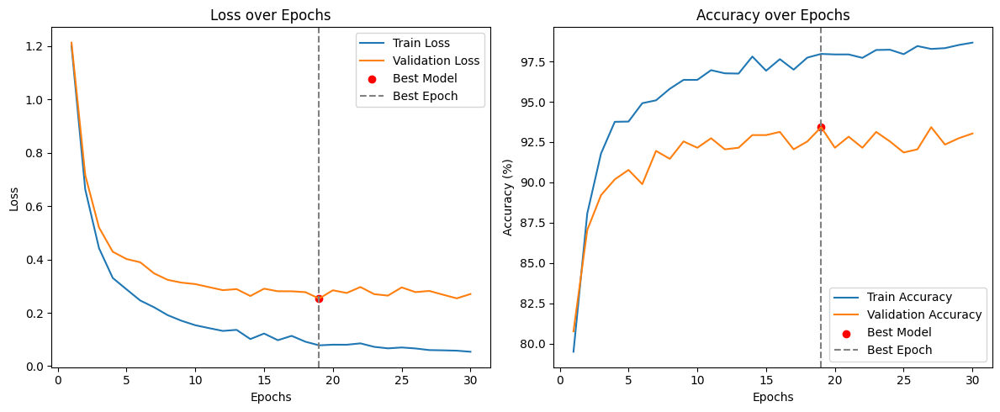

Best model loaded from ResNet50.pth.
Training completed. Best model saved at epoch 19.


Evaluating: 100%|██████████| 385/385 [01:14<00:00,  5.19it/s]


Train Loss: 0.0816, Train Accuracy: 97.87%


Evaluating: 100%|██████████| 64/64 [00:06<00:00,  9.62it/s]


Validation Loss: 0.2536, Validation Accuracy: 93.42%


Evaluating: 100%|██████████| 64/64 [00:06<00:00,  9.80it/s]

Test Loss: 0.2344, Test Accuracy: 93.52%


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(ResNet50.fc.parameters(), lr=0.0005)
train_model(ResNet50, train_loader, val_loader, test_loader, criterion, optimizer, device, "ResNet50.pth", num_epochs=30)

## In this experiment, I used pre-trained models (MobileNetV2, ResNet50, and VGG16) for classifying the Oxford 102 Flower dataset. We modified only the last fully connected (FC) layer of each model to match the 102 classes in our dataset, freezing the other layers to retain their learned features. All models were trained under the same conditions, including learning rate and number of epochs.

#### Summary of Results

| Architecture   | Number of Parameters | Learnable Parameters | Portion of Learnable Parameters | Accuracy on Test | Accuracy on Train | Test Loss | Train Loss |
|----------------|----------------------|----------------------|-------------------------------|------------------|-------------------|-----------|------------|
| MobileNetV2    | 3.4 million          | 131k                 | 5.55%                         | 93.52%           | 98.65%            | 0.2189    | 0.0495     |
| ResNet50       | 25.6 million         | 209k                 | 0.88%                         | 93.52%           | 97.87%            | 0.2344    | 0.0948     |
| VGG16          | 138 million          | 418k                 | 0.31%                         | 86.46%           | 97.27%            | 0.6097    | 0.0816     |

#### Performance Analysis

1. **Accuracy on Test Set**:
   - **MobileNetV2** and **ResNet50** achieved the highest test accuracy (93.52%), indicating that both models can effectively generalize to unseen data.
   - **VGG16**, on the other hand, performed significantly worse (86.46%). This may be attributed to the model's complexity and overfitting, especially since it has a much larger number of parameters that are not being fully utilized due to the freezing of layers.

2. **Learnable Parameters**:
   - **MobileNetV2** has the smallest number of learnable parameters (131k) and the highest portion of learnable parameters (5.55%). This indicates that it is a lightweight model designed for efficiency, which likely helps it adapt well to the dataset.
   - **ResNet50** has 209k learnable parameters, with a small portion of the total parameters being tuned (0.88%).
   - **VGG16** has the highest number of learnable parameters (418k) but a very low portion (0.31%), which suggests that many of its parameters are not being adjusted during training, potentially leading to suboptimal performance.

3. **Training vs. Test Accuracy**:
   - The training accuracy is high across all models, indicating that the models can fit the training data well. However, the significant drop in accuracy for **VGG16** on the test set suggests it may be overfitting.
   - **MobileNetV2** and **ResNet50** maintained robust performance on both training and test sets.

4. **Loss Values**:
   - **MobileNetV2** has the lowest test loss (0.2189), indicating better generalization.
   - **ResNet50** (0.2344) and **VGG16** (0.6097) exhibit higher test losses, indicating challenges in generalization compared to MobileNetV2.

### Conclusion

The differences in accuracy and loss values among the three models can be attributed to several factors:

- **Model Complexity**: VGG16's high complexity and number of parameters may lead to overfitting, resulting in lower generalization performance.
- **Learnable Parameters**: The proportion of learnable parameters plays a crucial role in performance; MobileNetV2's higher ratio allows it to adapt more effectively to the new task.
- **Architecture Design**: MobileNetV2 and ResNet50 are designed with efficiency in mind, allowing them to achieve comparable performance despite having significantly different architectures and parameter counts.

Overall, this analysis highlights the importance of model architecture, parameter count, and the tuning of layers in training deep learning models for specific tasks.

# **Section 5** Retrainin MobileNetV2 Trained from Scratch on Oxford dataset

In [8]:
# Step 3: Load MobileNetV2 and modify
MBNV2 = models.mobilenet_v2(pretrained=False)
MBNV2.classifier[1] = nn.Linear(MBNV2.last_channel, len(flower_labels))  # Replace the classification layer
MBNV2 = MBNV2.to(device)  # Move model to GPU or CPU
    
parameter_calculator(MBNV2, "MobileNet v2")
print(MBNV2)

MobileNet v2: Total Parameters: 2354534, Learnable Parameters: 2354534, 100.0000% is learnable
MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Co

Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.64it/s]


Epoch [1/30] - Train Loss: 3.8062, Train Acc: 9.51% - Val Loss: 3.7394, Val Acc: 10.11%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.61it/s]


Epoch [2/30] - Train Loss: 3.4003, Train Acc: 16.49% - Val Loss: 3.3128, Val Acc: 18.25%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.71it/s]


Epoch [3/30] - Train Loss: 3.4553, Train Acc: 19.46% - Val Loss: 3.4308, Val Acc: 22.18%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.62it/s]


Epoch [4/30] - Train Loss: 2.9613, Train Acc: 23.09% - Val Loss: 2.9472, Val Acc: 24.24%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.65it/s]


Epoch [5/30] - Train Loss: 2.4162, Train Acc: 33.75% - Val Loss: 2.4532, Val Acc: 33.07%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.72it/s]


Epoch [6/30] - Train Loss: 2.2279, Train Acc: 38.77% - Val Loss: 2.2288, Val Acc: 39.84%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.63it/s]


Epoch [7/30] - Train Loss: 2.1674, Train Acc: 41.39% - Val Loss: 2.3267, Val Acc: 37.88%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.71it/s]


Epoch [8/30] - Train Loss: 1.8440, Train Acc: 48.24% - Val Loss: 1.9951, Val Acc: 45.53%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.61it/s]


Epoch [9/30] - Train Loss: 1.7273, Train Acc: 51.57% - Val Loss: 1.8372, Val Acc: 48.87%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.58it/s]


Epoch [10/30] - Train Loss: 1.4645, Train Acc: 59.08% - Val Loss: 1.6294, Val Acc: 55.94%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.62it/s]


Epoch [11/30] - Train Loss: 1.2334, Train Acc: 64.67% - Val Loss: 1.4662, Val Acc: 59.47%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.65it/s]


Epoch [12/30] - Train Loss: 1.2933, Train Acc: 64.01% - Val Loss: 1.5029, Val Acc: 58.98%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.69it/s]


Epoch [13/30] - Train Loss: 1.1161, Train Acc: 67.68% - Val Loss: 1.3136, Val Acc: 63.59%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.67it/s]


Epoch [14/30] - Train Loss: 0.8769, Train Acc: 74.26% - Val Loss: 1.1547, Val Acc: 66.34%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.66it/s]


Epoch [15/30] - Train Loss: 0.8579, Train Acc: 74.20% - Val Loss: 1.1784, Val Acc: 66.93%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.63it/s]


Epoch [16/30] - Train Loss: 0.7364, Train Acc: 78.33% - Val Loss: 1.0313, Val Acc: 71.54%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.61it/s]


Epoch [17/30] - Train Loss: 0.7305, Train Acc: 77.66% - Val Loss: 1.0952, Val Acc: 69.09%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.65it/s]


Epoch [18/30] - Train Loss: 0.6793, Train Acc: 79.86% - Val Loss: 1.0443, Val Acc: 72.52%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.63it/s]


Epoch [19/30] - Train Loss: 0.5917, Train Acc: 82.31% - Val Loss: 0.9229, Val Acc: 73.31%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.62it/s]


Epoch [20/30] - Train Loss: 0.5074, Train Acc: 84.51% - Val Loss: 0.8749, Val Acc: 76.74%


Evaluating: 100%|██████████| 385/385 [01:09<00:00,  5.55it/s]


Epoch [21/30] - Train Loss: 0.5055, Train Acc: 84.33% - Val Loss: 0.8887, Val Acc: 74.09%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.59it/s]


Epoch [22/30] - Train Loss: 0.4339, Train Acc: 86.88% - Val Loss: 0.8397, Val Acc: 76.55%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.68it/s]


Epoch [23/30] - Train Loss: 0.4394, Train Acc: 86.39% - Val Loss: 0.8429, Val Acc: 76.55%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.63it/s]


Epoch [24/30] - Train Loss: 0.4922, Train Acc: 84.65% - Val Loss: 0.8733, Val Acc: 75.47%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.69it/s]


Epoch [25/30] - Train Loss: 0.4927, Train Acc: 85.25% - Val Loss: 0.9691, Val Acc: 74.19%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.68it/s]


Epoch [26/30] - Train Loss: 0.3729, Train Acc: 88.88% - Val Loss: 0.8231, Val Acc: 79.10%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.66it/s]


Epoch [27/30] - Train Loss: 0.2850, Train Acc: 91.32% - Val Loss: 0.7328, Val Acc: 80.57%


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.68it/s]


Epoch [28/30] - Train Loss: 0.2824, Train Acc: 91.35% - Val Loss: 0.7674, Val Acc: 78.70%


Evaluating: 100%|██████████| 385/385 [01:09<00:00,  5.55it/s]


Epoch [29/30] - Train Loss: 0.3041, Train Acc: 90.12% - Val Loss: 0.7895, Val Acc: 79.00%


Evaluating: 100%|██████████| 385/385 [01:08<00:00,  5.61it/s]


Epoch [30/30] - Train Loss: 0.2304, Train Acc: 92.55% - Val Loss: 0.6868, Val Acc: 81.16%


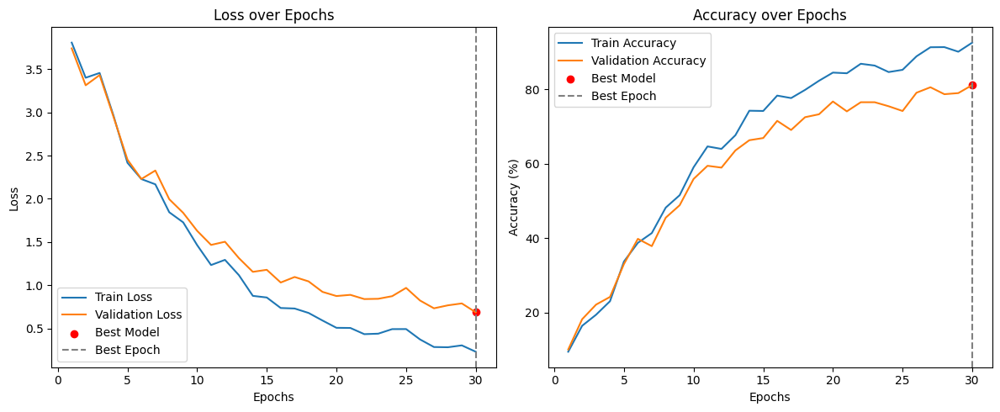

Best model loaded from MBNV2.pth.
Training completed. Best model saved at epoch 30.


Evaluating: 100%|██████████| 385/385 [01:07<00:00,  5.74it/s]


Train Loss: 0.2321, Train Accuracy: 92.78%


Evaluating: 100%|██████████| 64/64 [00:05<00:00, 11.75it/s]


Validation Loss: 0.6868, Validation Accuracy: 81.16%


Evaluating: 100%|██████████| 64/64 [00:05<00:00, 11.76it/s]

Test Loss: 0.7846, Test Accuracy: 81.16%


In [9]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(MBNV2.parameters(), lr=0.001)
train_model(MBNV2, train_loader, val_loader, test_loader, criterion, optimizer, device, "MBNV2.pth", num_epochs=30)

### Analysis of MobileNetV2 Trained from Scratch

In this section, I analyze the performance of MobileNetV2 when trained from scratch with randomly initialized weights, compared to the pre-trained version previously examined. The training conditions remained consistent, including learning rate and number of epochs.

#### Summary of Results for MobileNetV2 Trained from Scratch

| Metric                   | MobileNetV2 (Pre-trained) | MobileNetV2 (From Scratch) |
|--------------------------|---------------------------|-----------------------------|
| Train Loss               | 0.0495                    | 0.2321                      |
| Train Accuracy           | 98.65%                    | 92.78%                      |
| Test Loss                | 0.2189                    | 0.7846                      |
| Test Accuracy            | 93.52%                    | 81.16%                      |

### Performance Analysis

1. **Training Accuracy and Loss**:
   - The pre-trained MobileNetV2 achieved a training accuracy of **98.65%** with a very low training loss of **0.0495**. In contrast, the model trained from scratch achieved a lower training accuracy of **92.78%** and a higher training loss of **0.2321**.
   - This indicates that the pre-trained model can fit the training data much better, likely due to its learned features from a large dataset (ImageNet).

2. **Validation and Test Accuracy and Loss**:
   - The pre-trained model again outperformed the from-scratch model in terms of validation accuracy (**93.52%** vs. **81.16%**) and test accuracy (**93.52%** vs. **81.16%**). The validation and test losses were notably higher for the model trained from scratch (**0.6868** and **0.7846**, respectively).
   - The significant drop in performance for the model trained from scratch suggests it has not learned to generalize well from the training data compared to the pre-trained model.

### Conclusion and Recommendations

- **Transfer Learning vs. Training from Scratch**: The analysis clearly shows that using the pre-trained MobileNetV2 yields superior performance in terms of both training and generalization. The pre-trained model benefits from the rich feature representations learned from a large dataset, which significantly aids in tasks with limited data.
  
- **Recommendation**: It is advisable to use the pre-trained MobileNetV2 model for tasks involving classification of the Oxford 102 Flower dataset, especially when computational resources or training data are limited. The transfer learning approach allows for faster convergence and better accuracy compared to training from scratch.

### Comparison with ResNet50 (Pre-trained)

| Metric                   | ResNet50 (Pre-trained) | MobileNetV2 (Pre-trained) |
|--------------------------|------------------------|----------------------------|
| Train Loss               | 0.0948                 | 0.0495                     |
| Train Accuracy           | 97.87%                 | 98.65%                     |
| Test Loss                | 0.6097                 | 0.2189                     |
| Test Accuracy            | 93.52%                 | 93.52%                     |

### Additional Observations

- **ResNet50 vs. MobileNetV2**: Both pre-trained models achieve the same test accuracy, but MobileNetV2 has a lower test loss, indicating better generalization. However, MobileNetV2 has a slightly higher training accuracy, suggesting that it might fit the training data better than ResNet50.
  
- **Choosing Between Models**: If computational efficiency is a priority, MobileNetV2 is preferred due to its lightweight nature and lower parameter count. However, if more complex features are needed, ResNet50 could be a better choice despite its larger size.

In conclusion, leveraging pre-trained models, especially when resources are limited, is a highly effective strategy in deep learning applications.